In [7]:
import pandas as pd
import os
import os.path, sys
import shutil
import glob
import numpy as np
import SimpleITK as sitk
import random

# to query local databse
from mylocalbase import localengine
from sqlalchemy.orm import sessionmaker
import mylocaldatabase_new

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)

import numpy.ma as ma
from skimage.measure import find_contours, approximate_polygon

from scipy.spatial import Delaunay
from matplotlib.collections import LineCollection
from mpl_toolkits.axes_grid1 import make_axes_locatable

# to save graphs
import six.moves.cPickle as pickle
import gzip

import networkx as nx


# Explore a normal patterns from detections

In [8]:
line='99999_0001_7575429_right_2_1_NS_NF_probmap.mha'
processed_path = 'Y:\\Hongbo\\processed_data'
probmaps_path = 'Y:\\Hongbo\\segmentations_train'
graphs_path = 'Z:\\Cristina\\Section3\\breast_MR_pipeline\\graphs'
triangulation_path = 'Z:\\Cristina\\Section3\\breast_MR_pipeline\\triangulations'

inormal = 0
print(line)
fileline = line.split('_')
lesion_id = 'n'+str(inormal) 
oldlesion_id = int(fileline[0])
inormal+=1
fStudyID = fileline[1] 
AccessionN = fileline[2]  
sideB = fileline[3]


#############################
###### 1) Accesing mc images, prob maps, gt_lesions and breast masks
#############################
# get dynmic series info
glob_result = glob.glob( os.path.join(processed_path,'{}_{}_{}_'.format(str(oldlesion_id),fStudyID.zfill(4),AccessionN)+'*@*'))
onlydyn_results = [os.path.basename(s) for s in glob_result  if "@" in s]        
globdyn_series =  [s.split('@')[0].split('_') for s in onlydyn_results  if "@" in s]
precontrast_id = np.min([int(s[-1]) for s in globdyn_series])
DynSeries_nums = [str(n) for n in range(precontrast_id,precontrast_id+5)]

DynSeries_imagefiles = []
mriVols = []
print "Reading MRI volumes..."
for j in range(5):
    #the output mha:lesionid_patientid_access#_series#@acqusionTime.mha
    DynSeries_filename = '{}_{}_{}_{}'.format(str(oldlesion_id),fStudyID.zfill(4),AccessionN,DynSeries_nums[j] )

    #write log if mha file not exist             
    glob_result = glob.glob(os.path.join(processed_path,DynSeries_filename+'*')) #'*':do not to know the exactly acquistion time
    if glob_result != []:
        filename = glob_result[0]

    # add side info from the side of the lesion
    filename_wside = filename[:-4]+'_{}.mha'.format(sideB)
    DynSeries_imagefiles.append(filename_wside)

    # read Volumnes
    mriVols.append( sitk.GetArrayFromImage(sitk.Cast(sitk.ReadImage(DynSeries_imagefiles[j]),sitk.sitkFloat32)) )

# read only one bilateral volume for left/right splitting
bilateral_filename = '{}_{}_{}_{}@'.format(str(oldlesion_id),fStudyID.zfill(4),AccessionN,DynSeries_nums[1] )
bilateral_filepath = glob.glob(os.path.join( processed_path,bilateral_filename+'*'+'_mc.mha' ))[0]
bilateral_Vol = sitk.GetArrayFromImage(sitk.Cast(sitk.ReadImage(bilateral_filepath),sitk.sitkFloat32)) 
# get original No of slices
nslices = bilateral_Vol.shape[0]
lefts = int(round(nslices/2))

#get wofs filename
print "Reading probability map..."
probmap_filename = '{}_{}_{}_{}#2_1_NS_NF_probmap.mha'.format(str(oldlesion_id),fStudyID.zfill(4),AccessionN,sideB)
probmap_filepath = os.path.join(probmaps_path,probmap_filename)
probmap = sitk.GetArrayFromImage(sitk.Cast( sitk.ReadImage(probmap_filepath), sitk.sitkFloat32)) 

print "Reading breast mask..." 
breastm_filename = '{}_{}_{}_wofs_reg_breastmask_{}.mha'.format(str(oldlesion_id),fStudyID.zfill(4),AccessionN,sideB)
breastm_filepath = os.path.join(processed_path,breastm_filename)
breastm = sitk.GetArrayFromImage(sitk.Cast( sitk.ReadImage(breastm_filepath), sitk.sitkFloat32))


99999_0001_7575429_right_2_1_NS_NF_probmap.mha
Reading MRI volumes...
Reading probability map...
Reading breast mask...


In [9]:
#############################
###### COMPLETE FOR ALL NORMAL SLICES
#############################      
allslices_anormalG = []
allslices_MST_anormalG = []

mask_mriVols = []
for k in range(5):
    mx = ma.masked_array(mriVols[k], mask=breastm==0)
    print "masked breastVol_%i, breast mean SI/enhancement = %f" % (k, mx.mean())
    mask_mriVols.append( ma.filled(mx, fill_value=None) )

# Compute ser volume (SERvol1/SERvol4) now is 3D volumes
SERvol1 = (mask_mriVols[1] - mask_mriVols[0])
SERvol4 = (mask_mriVols[4] - mask_mriVols[0])
# accoumt for zero value pixels in the denominator
SERvol4nonz = np.asarray([pix if pix != 0.0 else 0.01 for pix in SERvol4.flatten()]).reshape(SERvol4.shape) 
# compute SER, turned off pixels will have spurious high values
SER = np.asarray(SERvol1/SERvol4nonz)
# clip extremely low and high values ( see ipython notebook for SERexploration)
# explore other values for SER clipping
nonzSER =  [pix if pix >= 0.0 else -0.01 for pix in SER.flatten()]
nonzmax1p1SER =  np.asarray([pix if pix <= 2 else 2.5 for pix in nonzSER]).reshape(SER.shape)
nonzmax1p1SER = nonzmax1p1SER.astype(np.float32)

## Used only normal prob map 
# masked prob map, use the same threshold as Hongbo's experiments = 0.615, with an average FP/normal = 30%
mx_probmap = ma.masked_array(probmap, mask=probmap < 0.615)
print "masked mx_probmap, mean detection prob = %f" % mx_probmap.mean()
masked_probmap = ma.filled(mx_probmap, fill_value=0.0)

masked breastVol_0, breast mean SI/enhancement = 0.622055
masked breastVol_1, breast mean SI/enhancement = 0.555927
masked breastVol_2, breast mean SI/enhancement = 0.577907
masked breastVol_3, breast mean SI/enhancement = 0.583064
masked breastVol_4, breast mean SI/enhancement = 0.597887
masked mx_probmap, mean detection prob = 0.708238



============ slice 0
Number of points: 37 to 19 = 48 percent reduction
Number of points: 228 to 71 = 68 percent reduction
2 FP/slice: will reduce with normal graph pattern mining (hypothesis)
2 FP/slice: reduced by inforcing min # of 3 triangles/detection graph

============ slice 1
Number of points: 31 to 16 = 48 percent reduction
Number of points: 259 to 78 = 69 percent reduction
Number of points: 27 to 11 = 59 percent reduction
3 FP/slice: will reduce with normal graph pattern mining (hypothesis)
3 FP/slice: reduced by inforcing min # of 3 triangles/detection graph

============ slice 2
Number of points: 291 to 82 = 71 percent reduction
1 FP/slice: will reduce with normal graph pattern mining (hypothesis)
1 FP/slice: reduced by inforcing min # of 3 triangles/detection graph

============ slice 3
Number of points: 311 to 76 = 75 percent reduction
1 FP/slice: will reduce with normal graph pattern mining (hypothesis)
1 FP/slice: reduced by inforcing min # of 3 triangles/detection grap

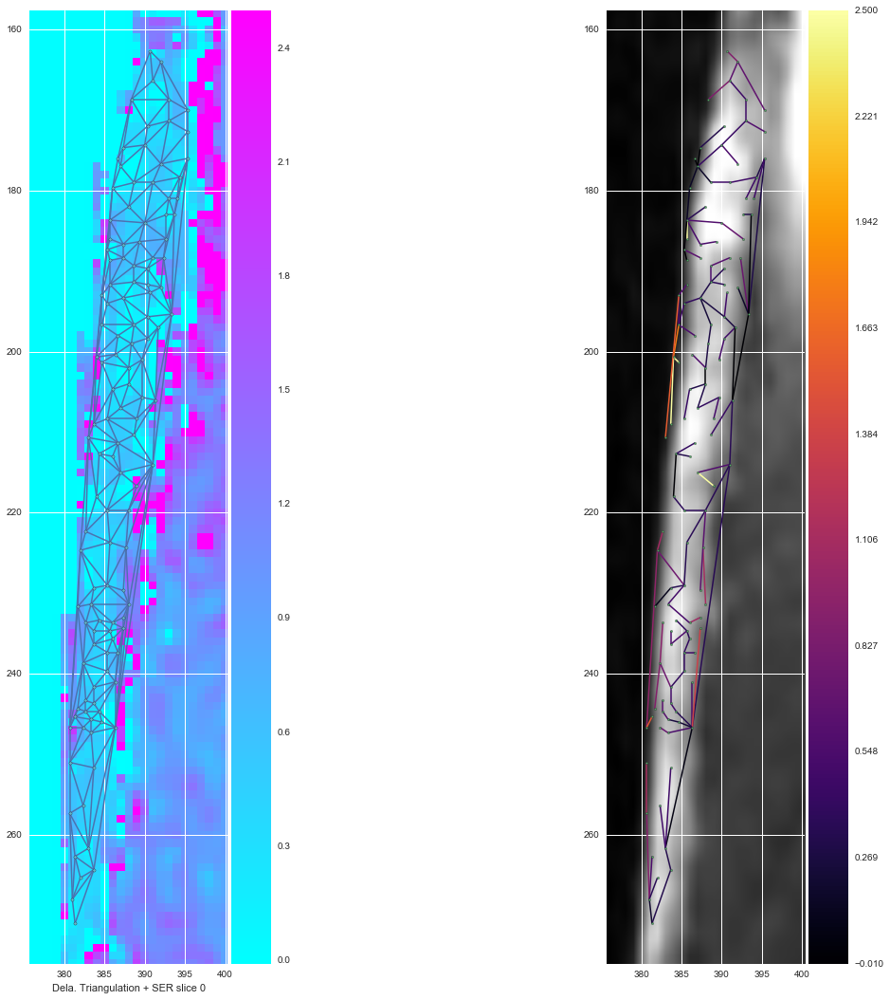

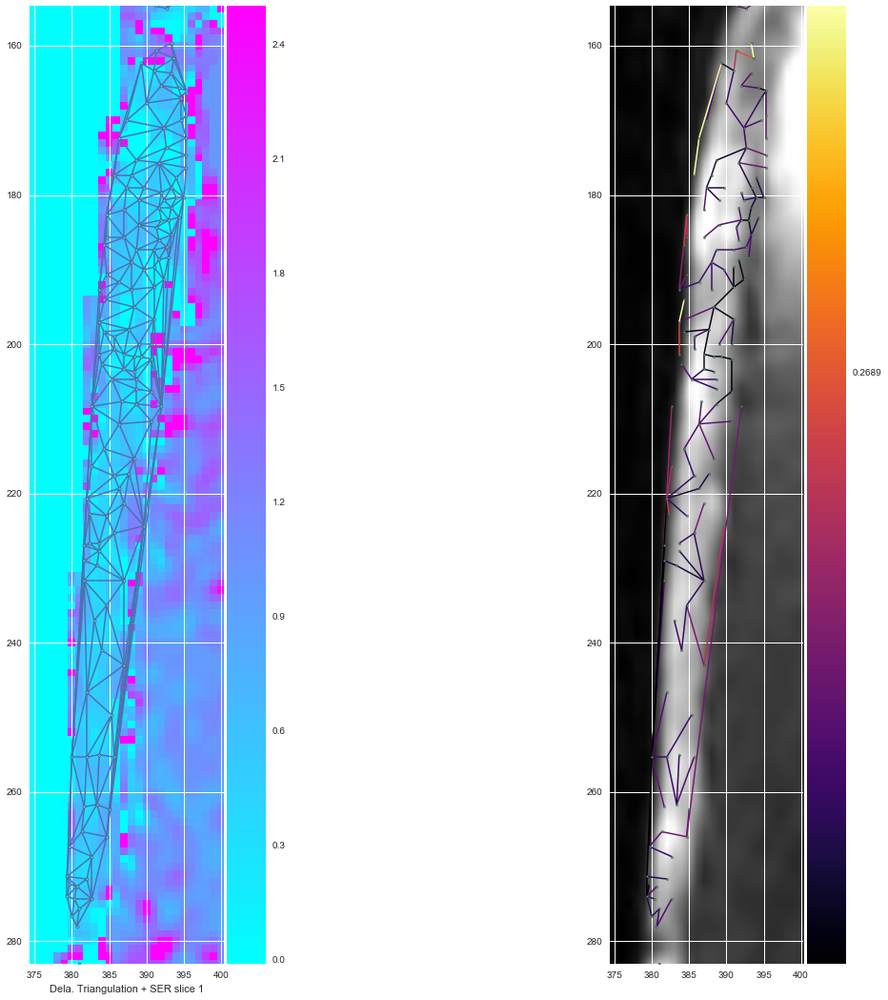

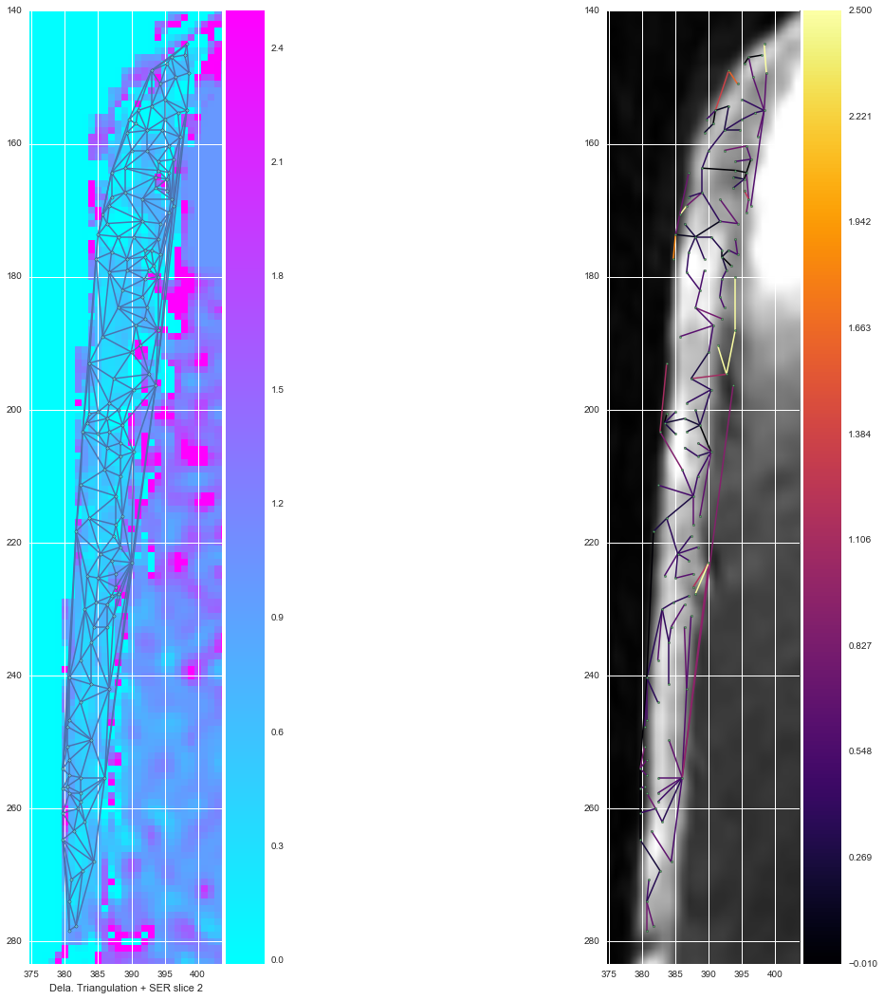

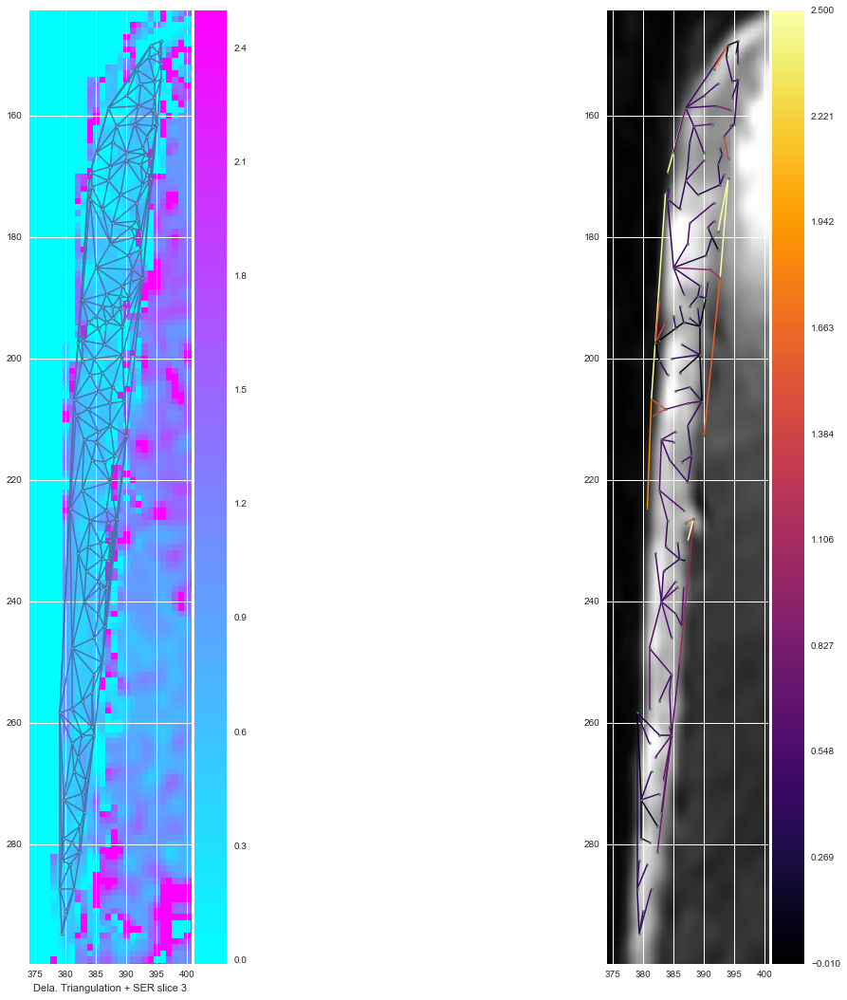

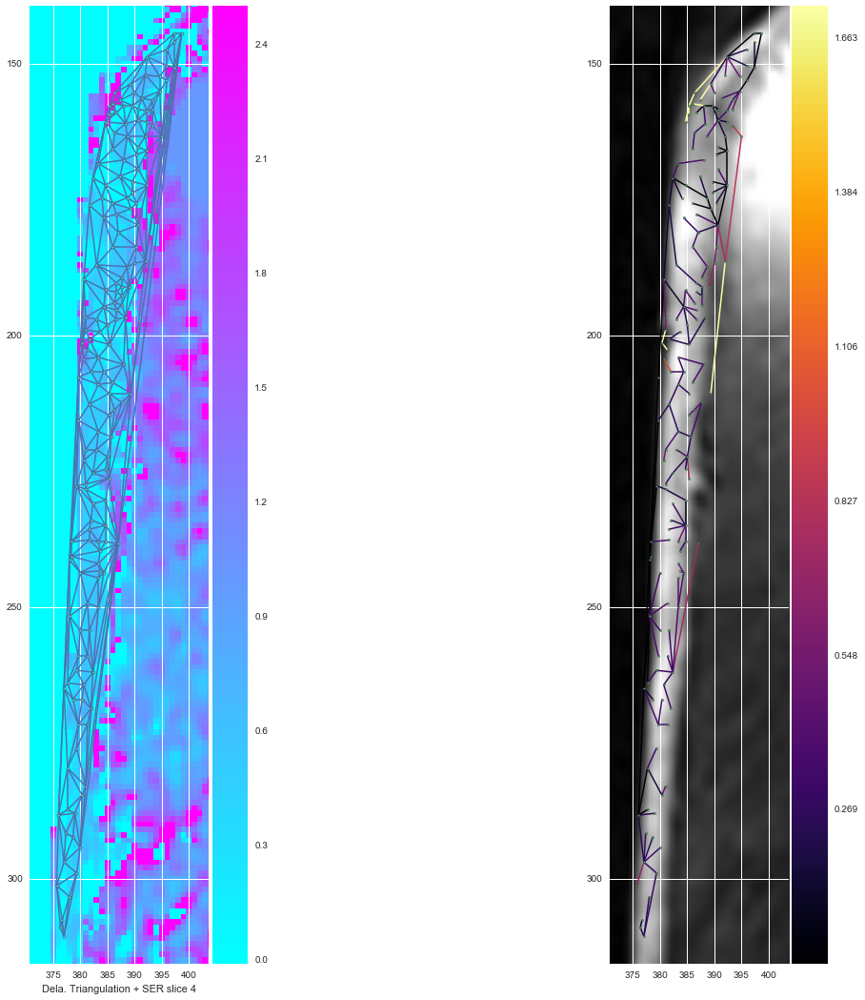

...

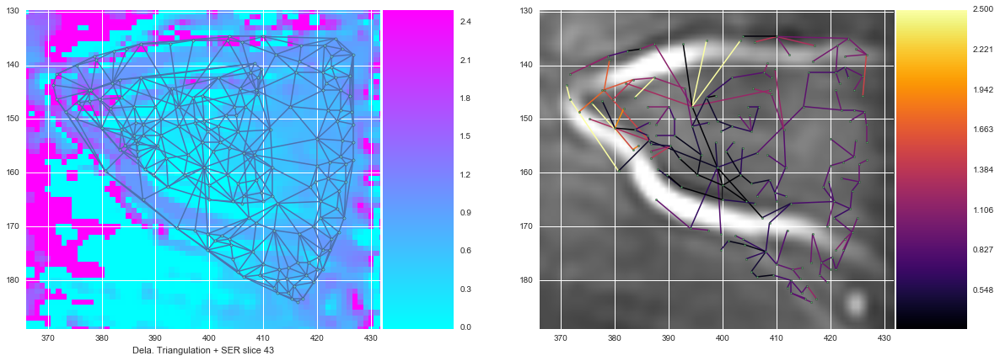

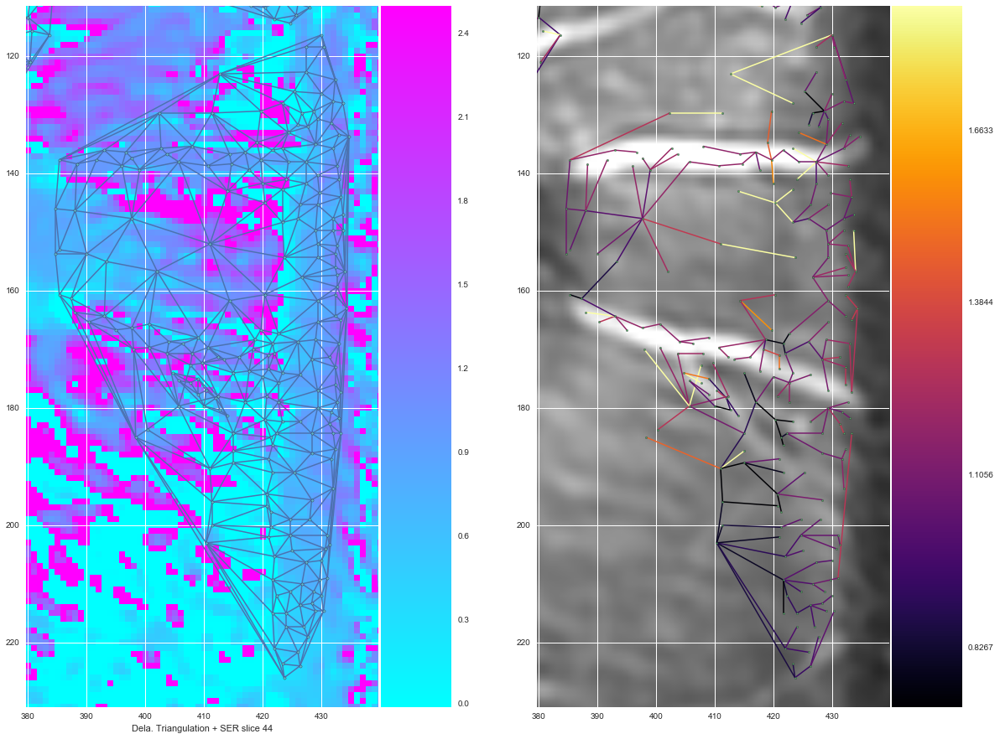

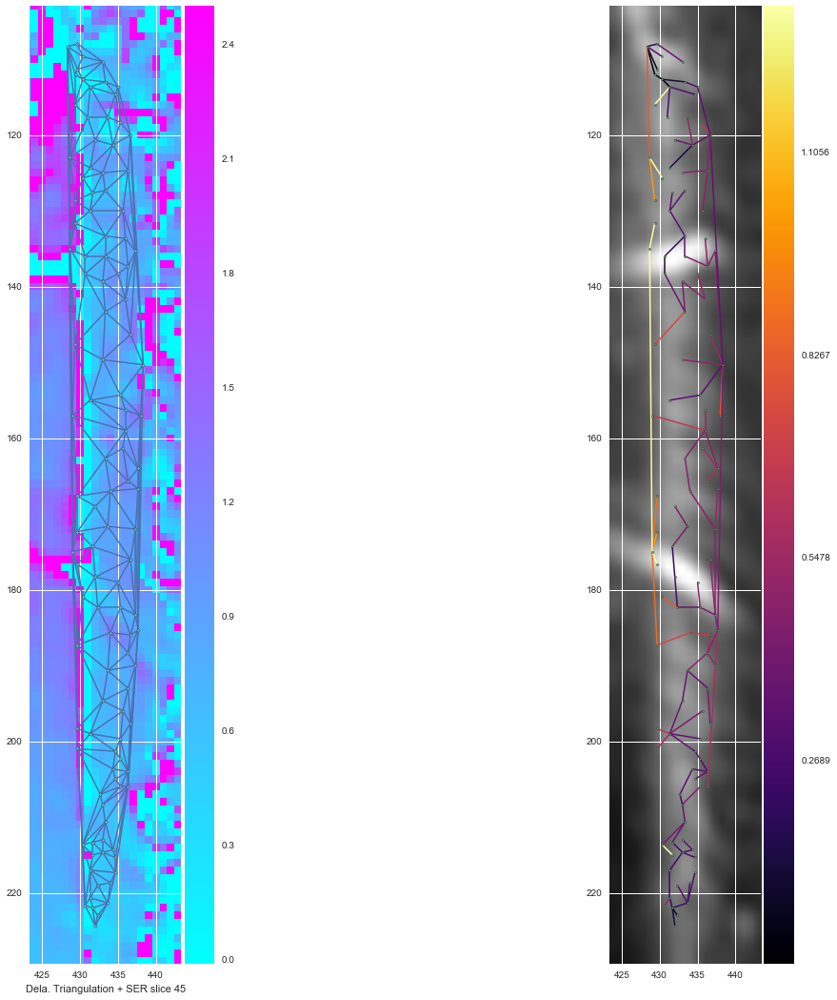

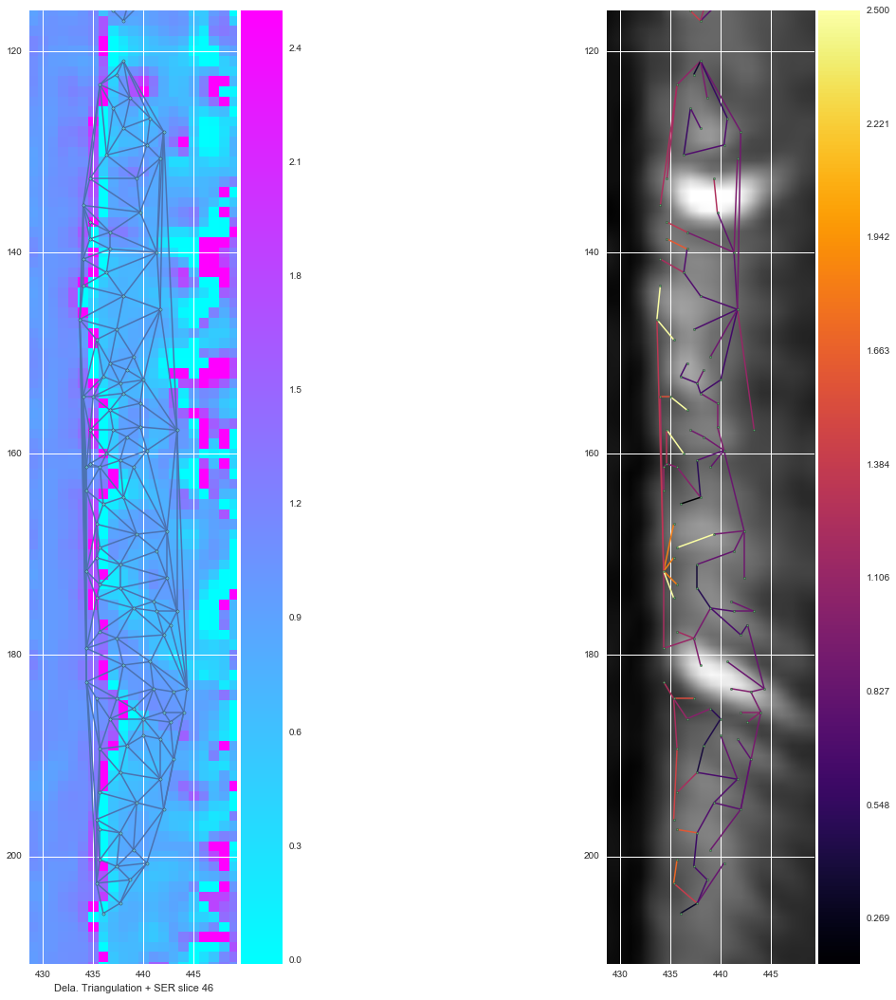

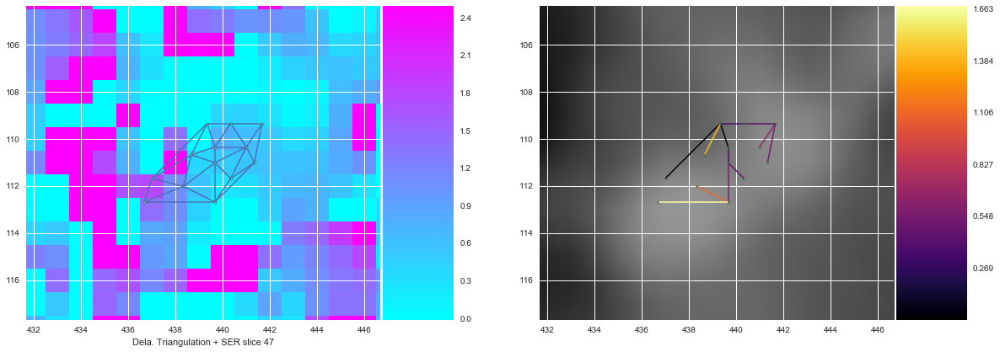

In [10]:
####################
### 6) Iterate through each slice and represent each slice as a nx graph
####################   
nslices = breastm.shape[0]
# To Display 
import matplotlib.pyplot as plt
%matplotlib inline 

for kslice in range(nslices):
    # iterate through slices
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 18))
    ax = axes.flatten()

    print "\n============ slice %d" %  kslice
    # Overlay the SER
    im = ax[0].imshow(nonzmax1p1SER[kslice,:,:], cmap=plt.cm.cool, interpolation='none', 
            clim=[min(nonzmax1p1SER[kslice,:,:].ravel()), max(nonzmax1p1SER[kslice,:,:].ravel())])
    ax[0].set_xlabel('Dela. Triangulation + SER slice '+str(kslice))

    # Set the colormap and norm to correspond to the data for which
    divider = make_axes_locatable(ax[0])
    caxSER = divider.append_axes("right", size="20%", pad=0.05)
    plt.colorbar(im, cax=caxSER)

    # Using the “marching squares” method to compute a the iso-valued contours 
    # from prob map
    outlines_probmap = find_contours(masked_probmap[kslice,:,:], 0)
    # initialize contents
    normals_delaunays_all = []
    aslice_anormalG = []
    aslice_MST_anormalG = []

    for oi, outline in enumerate(outlines_probmap):
        coords_probmap = approximate_polygon(outline, tolerance=0.5)

        if(len(coords_probmap)>9): # min 9 points or more (3 triangles)      
            print "Number of points: %d to %d = %d percent reduction" % ( len(outline), len(coords_probmap), float(len(outline)-len(coords_probmap))/len(outline)*100 )         
            ################
            # Add Delaunay triangulation
            ################
            # perform Delaunay triangulation on the pts for query lesion
            a = np.asarray( [coords_probmap[:, 1], coords_probmap[:, 0]] ).transpose()
            normals_delaunay = Delaunay(a)
            normals_triangles = normals_delaunay.points[normals_delaunay.vertices]   

            # append normal patterns
            normals_delaunays_all.append(normals_delaunay)

    # compute detection soleley based on thresholded probmap        
    print "%d FP/slice: will reduce with normal graph pattern mining (hypothesis)" % len(normals_delaunays_all)
    if(normals_delaunays_all):
        # iterate throught individual thrsholded detections/triangulations/plot and nx graph MST
        for kTriang in range(len(normals_delaunays_all)):            
            anormal_delaunay = normals_delaunays_all[kTriang]
            anormal_triangles = anormal_delaunay.points[anormal_delaunay.vertices]   

            ### filter only a minimum of 3 triangles
            if(len(anormal_triangles)>3):
                #########################
                # 6) Calculate triangulation faces, compute faces centroid, use as new triangulation points
                #########################
                trianF = []
                for verT in anormal_triangles:
                    trianF.append( list(verT.mean(axis=0) ))

                a = np.asarray( [np.asarray(trianF)[:,0], np.asarray(trianF)[:,1] ]).transpose()
                trianglFaces_delaunay = Delaunay(a)

                #############################
                ###  7) Create triangulation as a nx graph, Add weights inversely proportional to SER,  
                # The graph G can be grown in several ways. NetworkX includes many graph generator functions and facilities 
                # get list of delaunay points        
                pts = [tuple(pi.flatten()) for pi in trianglFaces_delaunay.points]            

                #############################
                ###### 4) Sample SER at nodes
                nodew = []
                #print "nodeweights" 
                for node in pts:
                    SERloc = tuple([int(loc) for loc in node])
                    #print nonzmax1p1SER[SERloc[1],SERloc[0]]
                    nodew.append( nonzmax1p1SER[kslice,SERloc[1],SERloc[0]] )

                # create placeholder for nx nodes
                #print(nodew)
                nodes = list(range(len(pts)))
                # mapping from vertices to nodes
                m = dict(enumerate(nodes)) 
                # get original position of points
                pos = dict(zip(nodes,pts))

                #Create a graph
                anormalG = nx.Graph() 
                for i in range(len(pts)):
                    # add position as node attributes
                    anormalG.add_node(i, pos=pos[i])

                #print "Average triangle weight"         
                for i in range(trianglFaces_delaunay.nsimplex):
                    # add edges with weigth attributes
                    wp1 = np.max([nodew[m[trianglFaces_delaunay.vertices[i,0]]], nodew[m[trianglFaces_delaunay.vertices[i,1]]]])
                    anormalG.add_edge( m[trianglFaces_delaunay.vertices[i,0]], m[trianglFaces_delaunay.vertices[i,1]], weight = wp1 )
                    wp2 = np.max([nodew[m[trianglFaces_delaunay.vertices[i,1]]], nodew[m[trianglFaces_delaunay.vertices[i,2]]]])
                    anormalG.add_edge( m[trianglFaces_delaunay.vertices[i,1]], m[trianglFaces_delaunay.vertices[i,2]], weight = wp2 )
                    wp3 = np.max([nodew[m[trianglFaces_delaunay.vertices[i,2]]], nodew[m[trianglFaces_delaunay.vertices[i,0]]]])
                    anormalG.add_edge( m[trianglFaces_delaunay.vertices[i,2]], m[trianglFaces_delaunay.vertices[i,0]], weight = wp3 )
                    #print(np.mean([wp1, wp2, wp3])) 

                ###### 5) Calculate minimum spanning Tree (MST)
                #############################
                MST = nx.minimum_spanning_edges( anormalG, data=True)
                edgelist = list(MST)

                #Convert minimum spanning tree into graph to be able to depth searched
                MST_lesionG = nx.from_edgelist(edgelist)
                for i in range(len(pts)):
                    # add position as node attributes
                    MST_lesionG.node[i]['pos']=pos[i]

                #print "all edges"
                #print MST_lesionG.edges(data=True)
                SER_nodeweights = [d['weight'] for (u,v,d) in MST_lesionG.edges(data=True)]

                #############################
                # draw graph
                nx.draw_networkx(anormalG, pos, ax=ax[0], with_labels=False, node_color='c',node_size=10, edge_color='b', width=1.5)

                # Overlay with the mri image
                nxg = nx.draw_networkx_edges(MST_lesionG, pos, ax=ax[1], edge_color=SER_nodeweights, 
                                             edge_cmap=plt.cm.inferno, 
                                             edge_vmin=min(SER_nodeweights),edge_vmax=max(SER_nodeweights), width=1.5)
                nx.draw_networkx_nodes(MST_lesionG, pos, ax=ax[1], node_size=20, node_shape='.', node_color='g', with_labels=False)

                # append to list per slice
                aslice_anormalG.append( anormalG )
                aslice_MST_anormalG.append( MST_lesionG )

        # compute detection soleley based on thresholded probmap        
        print "%d FP/slice: reduced by inforcing min # of 3 triangles/detection graph" % len(aslice_anormalG)
        if(len(aslice_anormalG)>0):
            ## Draw rest            
            ax[1].imshow(mriVols[4][kslice,:,:], cmap=plt.cm.gray)
            # add colormap
            v = np.linspace(-0.01, 2.5, 10, endpoint=True)
            divider = make_axes_locatable(ax[1])
            caxEdges = divider.append_axes("right", size="20%", pad=0.05)
            plt.colorbar(nxg, cax=caxEdges, ticks=v)

            # adjust visualization axes to largest detection
            listnpts = [anormalG.number_of_nodes() for anormalG in aslice_anormalG]
            largest_normal_delaunay = aslice_anormalG[ listnpts.index(np.max(listnpts)) ]

            # to restablish node positions
            pts = [attr['pos'] for (n,attr) in largest_normal_delaunay.nodes(data=True)]
            minTriag = np.asarray(pts).min(axis=0)
            maxTriag = np.asarray(pts).max(axis=0)
            # extend +/- 10 pixels
            ax[0].axis((minTriag[0]-5, maxTriag[0]+5, maxTriag[1]+5, minTriag[1]-5))
            ax[1].axis((minTriag[0]-5, maxTriag[0]+5, maxTriag[1]+5, minTriag[1]-5))

            ## append to list of all slices
            allslices_anormalG.append( aslice_anormalG )
            allslices_MST_anormalG.append( aslice_MST_anormalG )
        else:
            allslices_anormalG.append( [] )
            allslices_MST_anormalG.append( [] )            
    else:
        allslices_anormalG.append( [] )
        allslices_MST_anormalG.append( [] )    